In [1]:
# !pip install -q voyagerpy==0.1.1 gget==0.28.4 watermark==2.4.3 scanpy==1.10.1

# Introducion

In a [more introductory vignette](https://pmelsted.github.io/voyagerpy/examples/visium_10x.html), we performed basic non-spatial analyses on a mouse olfactory bulb Visium dataset from the 10X website. In this vignette, we perform spatial analyses in histological space as well as in gene expression space.

Here we load the packages used in this vignette:

In [2]:
import voyagerpy as vp

# Data handling and plotting
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

# File management and downloading
import os
import requests
import pathlib
import json
import gget  # mapping ensembl gene IDs to gene symbols

# Graph/matrix handling
import networkx as nx  # graph generation
from scipy.sparse import csr_matrix, issparse  # matrix handling
import scanpy as sc  # PCA and KNN

# Image handling
from scipy.ndimage import binary_opening, binary_closing, binary_fill_holes
from skimage.measure import label, regionprops
from skimage import color, morphology
from matplotlib.colors import ListedColormap
from shapely.affinity import scale
from matplotlib.lines import Line2D
from shapely.geometry import Point
from shapely.predicates import contains
import matplotlib.patches as patches
from scipy.stats import gaussian_kde

plt.rcParams['axes.grid'] = False
plt.rcParams['axes.edgecolor'] = 'none'  # Hides the axes border
# plt.rcParams['xtick.color'] = 'none'  # Hides x-axis ticks
# plt.rcParams['ytick.color'] = 'none'  # Hides y-axis ticks

plt.rcParams['figure.dpi'] = 120

# Turn on matplotlib interactive mode so we don't need to explicitly call plt.show()
_ = plt.ion()

In [3]:
root_dir = pathlib.Path(os.getcwd())
outs_dir = pathlib.Path(f'{root_dir}/outs')

outs_dir.mkdir(parents=True, exist_ok=True)

def download_data(tar_path, url_reads, outs_dir = outs_dir):
    if not tar_path.exists():
        res = requests.get(url_reads)
        with tar_path.open('wb') as f:
            f.write(res.content)

        # !tar -xvf $tar_path -C $outs_dir

Here we download the data from the 10X website. Contents of the outs directory as from Space Ranger is explained in the [introductory vignette](https://pmelsted.github.io/voyagerpy/examples/visium_10x.html).

In [4]:
# Download the unfiltered gene count matrix
tar_path = root_dir / 'visium_ob.tar.gz'
url_reads = "https://cf.10xgenomics.com/samples/spatial-exp/2.0.0/Visium_Mouse_Olfactory_Bulb/Visium_Mouse_Olfactory_Bulb_raw_feature_bc_matrix.tar.gz"
download_data(tar_path, url_reads)

# This is the spatial information
tar_path_spatial = root_dir / 'visium_ob_spatial.tar.gz'
url_reads_spatial = "https://cf.10xgenomics.com/samples/spatial-exp/2.0.0/Visium_Mouse_Olfactory_Bulb/Visium_Mouse_Olfactory_Bulb_spatial.tar.gz"
download_data(tar_path_spatial, url_reads_spatial)

Here we read the data into Python as an Anndata object

In [5]:
adata_image_res = 'hires'

adata = vp.read_10x_visium(
    outs_dir,
    datatype = 'mtx',
    raw = True,
    prefix = None,
    symbol_as_index=False,
    dtype=np.float64,
    res=adata_image_res
)

/Users/joeyrich/miniconda3/envs/seurat_vs_scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


Here we add QC metrics and plot them.

In [6]:
is_mt = adata.var['symbol'].str.contains('^mt-').values
vp.utils.add_per_cell_qcmetrics(adata, subsets={'mito': is_mt})

Retrieve the locations of visium spots

In [7]:
visium_spots = vp.spatial.get_visium_spots(adata, with_radius=True)

_ = vp.spatial.set_geometry(adata, geom="spot_poly", values=visium_spots)

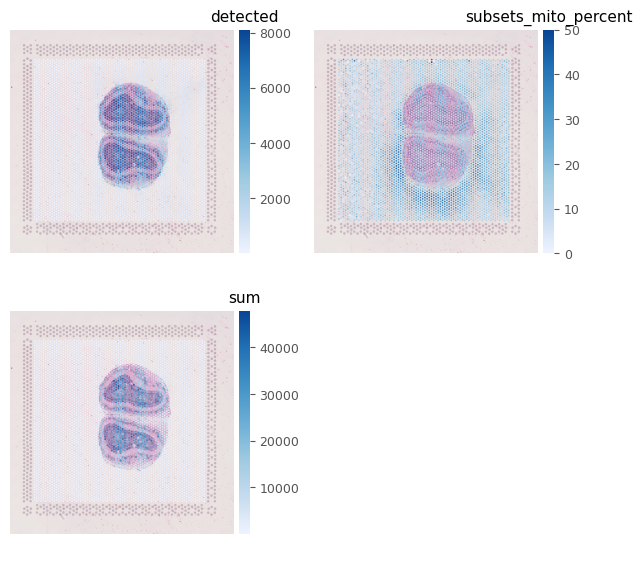

In [8]:
qc_features = ["detected", "subsets_mito_percent", "sum"]
axs = vp.plt.plot_spatial_feature(
    adata,
    qc_features,
    image_kwargs=dict(),
    subplot_kwargs=dict(figsize=(6,6), dpi=100, layout='tight')
)

## Tissue segmentation

While Space Ranger can automatically detect which spots are in tissue and the Loupe browser can be used to manually annotate which spots are in tissue, it may be interesting to get the tissue outline polygon, so we would know how much each spot overlaps with the tissue and plot the outline. We can perform this boundary detection computationally with scipy.ndimage.

Here we don’t have the full resolution image. We will perform tissue segmentation on the high resolution downsampled image and then scale it to make the coordinates of the tissue boundary match those of the spots.

In [9]:
image_path = 'outs/spatial/tissue_hires_image.png'
im = plt.imread(image_path)

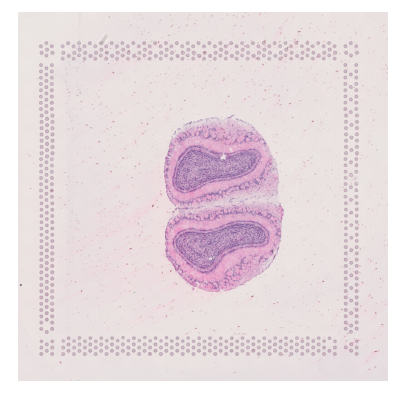

In [10]:
fig, ax = plt.subplots(figsize=(4,4))
_ = vp.plt.imshow(adata, ax = ax, origin = 'upper')

The array of dots framing the tissue seen in this image is the fiducials, used to align the tissue image to the positions of the Visium spots, so gene expression can be matched to spatial locations. The alignment of the fiducials is shown in `aligned_fiducials.jpg`. Space Ranger can automatically detect which spots are in tissue, and these spots are highlighted in `detected_tissue_image.jpg`.

Inside the `scalefactors_json.json` file:

In [11]:
json_path = outs_dir / 'spatial' / 'scalefactors_json.json'

with json_path.open() as file:
    print(json.load(file))

{'tissue_hires_scalef': 0.2, 'tissue_lowres_scalef': 0.06, 'fiducial_diameter_fullres': 118.91545, 'spot_diameter_fullres': 73.61433}


Here we show the RGB channels separately

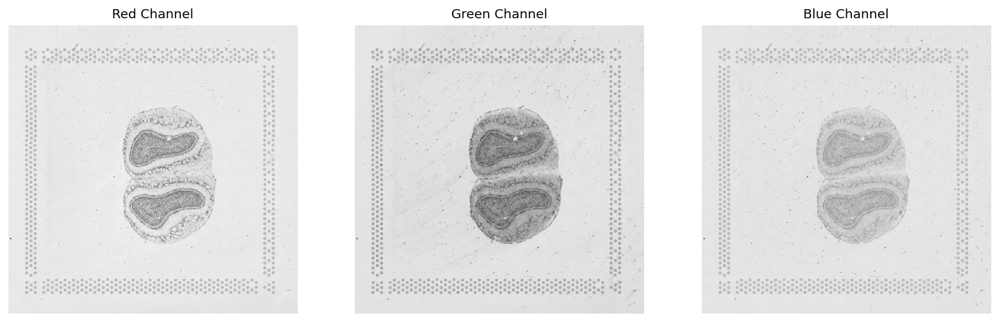

In [12]:
image_path = 'outs/spatial/tissue_hires_image.png'
im = plt.imread(image_path)

# Split the image into RGB components
r = im[:, :, 0]
g = im[:, :, 1]
b = im[:, :, 2]

r = np.flipud(r)
g = np.flipud(g)
b = np.flipud(b)

# Create a figure with 3 subplots side by side
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Display each channel
axs[0].imshow(r, cmap='gray', origin='lower')
axs[0].set_title('Red Channel')
axs[0].axis('off')  # Hide axes

axs[1].imshow(g, cmap='gray', origin='lower')
axs[1].set_title('Green Channel')
axs[1].axis('off')  # Hide axes

axs[2].imshow(b, cmap='gray', origin='lower')
axs[2].set_title('Blue Channel')
axs[2].axis('off')  # Hide axes

plt.show()

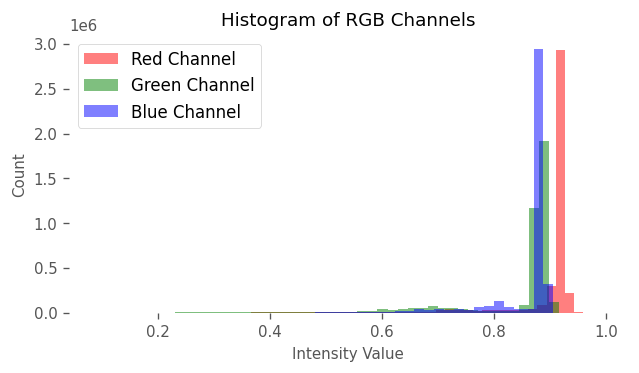

In [13]:
r = im[:, :, 0].flatten()  # Flatten to 1D array for histogram
g = im[:, :, 1].flatten()  # Flatten to 1D array for histogram
b = im[:, :, 2].flatten()  # Flatten to 1D array for histogram

bins = 50  # Adjust this value based on your specific image data range

# Create histograms
plt.figure(figsize=(6,3))
plt.hist(r, bins=bins, color='red', alpha=0.5, label='Red Channel')
plt.hist(g, bins=bins, color='green', alpha=0.5, label='Green Channel')
plt.hist(b, bins=bins, color='blue', alpha=0.5, label='Blue Channel')

# Add labels and title
plt.xlabel('Intensity Value')
plt.ylabel('Count')
plt.title('Histogram of RGB Channels')
plt.legend()

# Show the plot
plt.show()

The tissue can be discerned with thresholding. The tall peak on the right is the background. The much lower peaks from around 0.6 to 0.85 must be the tissue. To capture the faint bluish region, the blue channel is used for thresholding. The threshold here is chosen based on the histogram and experimenting with nearby values.

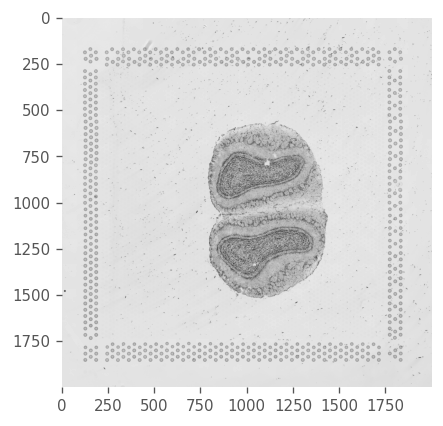

In [14]:
img2 = color.rgb2gray(im)
plt.figure(figsize=(4, 4))
_ = plt.imshow(img2, origin = 'upper', cmap = 'gray')

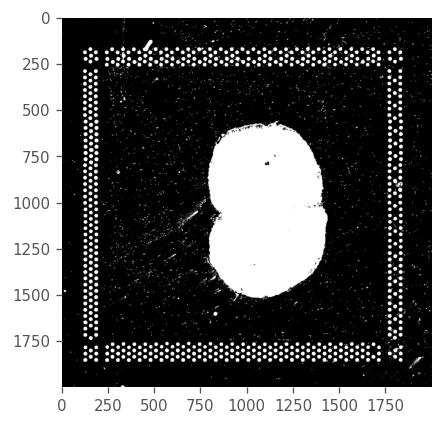

In [15]:
mask = im[:,:,2] < 0.87
plt.figure(figsize=(4, 4))
_ = plt.imshow(mask, origin='upper', cmap = 'gray')

Then we use an opening operation (erosion followed by dilation) to denoise

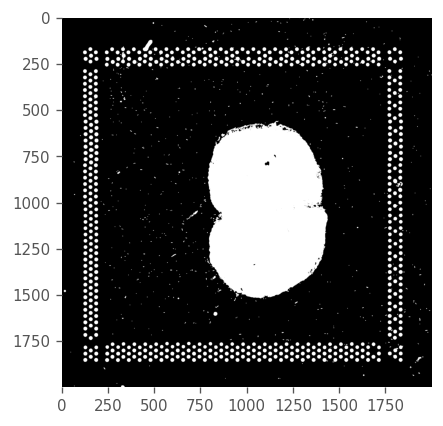

In [16]:
kern = np.ones((3, 3), dtype=np.uint8)

mask_open = binary_opening(mask, structure=kern)

plt.figure(figsize=(4, 4))
_ = plt.imshow(mask_open, origin='upper', cmap = 'gray')

There are some small holes in the tissue, which can be removed by a closing operation (dilation followed by erosion):

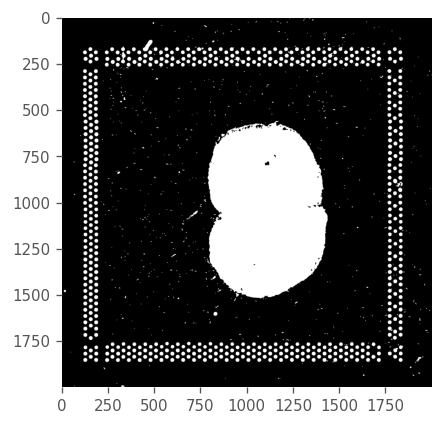

In [17]:
mask_close = binary_closing(mask_open, kern)
plt.figure(figsize=(4, 4))
_ = plt.imshow(mask_close, origin='upper', cmap = 'gray')

There are some larger holes in the tissue mask, which may be real holes or faint regions with few nuclei missed by thresholding. They might not be large enough to affect which Visium spots intersect the tissue.

Now the main piece of tissue is clear. It must be the object with the largest area. However, there are two small pieces that should belong to the tissue at the top left. The debris and fiducials can be removed by setting all pixels in the mask outside the bounding box of the main piece to 0. Here we assign a different value to each contiguous object and find the area among other shape features (e.g. perimeter) of each object.

In [18]:
mask_label = label(mask_close, connectivity=2)
properties = regionprops(mask_label)

def radii_from_centroid(region):
    centroid = np.array(region.centroid)
    coords = np.array(region.coords)
    distances = np.linalg.norm(coords - centroid, axis=1)
    return distances

# Print area and perimeter for each region
for prop in properties[:6]:
    radii = radii_from_centroid(prop)

    print(f"Label: {prop.label}, Area: {prop.area}, Perimeter: {prop.perimeter}, Radius mean: {np.mean(radii)}, Radius std: {np.std(radii)}, Radius min: {np.min(radii)}, Radius max: {np.max(radii)}")

Label: 1, Area: 25.0, Perimeter: 17.621320343559642, Radius mean: 2.1943061647255764, Radius std: 1.018734732620485, Radius min: 0.16492422502469775, Radius max: 4.20323684795417
Label: 2, Area: 15.0, Perimeter: 12.0, Radius mean: 1.5067417439661026, Radius std: 0.6295998599560315, Radius min: 0.0, Radius max: 2.23606797749979
Label: 3, Area: 14.0, Perimeter: 10.82842712474619, Radius mean: 1.4085841751813566, Radius std: 0.4797669597985792, Radius min: 0.7071067811865476, Radius max: 2.1213203435596424
Label: 4, Area: 15.0, Perimeter: 12.0, Radius mean: 1.5067417439661026, Radius std: 0.6295998599560315, Radius min: 0.0, Radius max: 2.23606797749979
Label: 5, Area: 9.0, Perimeter: 8.0, Radius mean: 1.0729838054991534, Radius std: 0.4266603877440328, Radius min: 0.0, Radius max: 1.4142135623730951
Label: 6, Area: 9.0, Perimeter: 8.0, Radius mean: 1.0729838054991534, Radius std: 0.4266603877440328, Radius min: 0.0, Radius max: 1.4142135623730951


In [19]:
max_area = 0
max_label = None
for prop in properties:
    if prop.area > max_area:
        max_area = prop.area
        max_label = prop.label

if max_label is not None:
    inds = np.argwhere(mask_label == max_label)
    # Print the first few coordinates
    print("Coordinates of the region with the max area:")
    print(inds[:6])  # prints first 6 coordinates
else:
    print("No regions found or something went wrong.")

Coordinates of the region with the max area:
[[ 561 1167]
 [ 561 1168]
 [ 561 1169]
 [ 562 1157]
 [ 562 1158]
 [ 562 1159]]


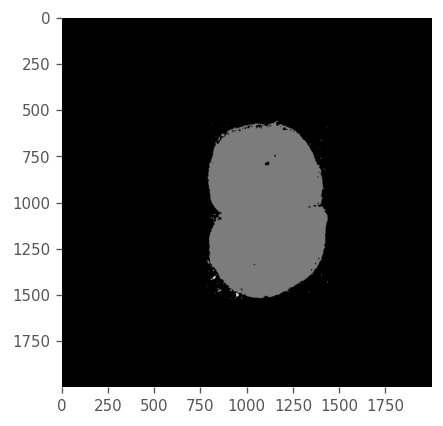

In [20]:
region = next((prop for prop in properties if prop.label == max_label), None)

if region is not None:
    # Extract the bounding box of the region with the max area
    minr, minc, maxr, maxc = region.bbox

    # Compute indices to zero out
    # Rows outside the bounding box
    row_inds = np.concatenate((np.arange(minr), np.arange(maxr + 1, mask_label.shape[0])))
    # Columns outside the bounding box
    col_inds = np.concatenate((np.arange(minc), np.arange(maxc + 1, mask_label.shape[1])))

    # Set these regions in the mask to zero
    mask_label[row_inds, :] = 0
    mask_label[:, col_inds] = 0
else:
    print("Region not found.")

plt.figure(figsize=(4, 4))
_ = plt.imshow(mask_label, origin='upper', cmap = 'gray')

Then remove the small pieces that are debris.

In [21]:
np.unique(mask_label)

array([  0, 419, 423, 427, 428, 436, 448, 456, 459, 467, 471, 481, 485,
       503, 521, 631, 638, 640, 649, 674, 735, 737, 753, 758, 771, 774,
       785, 787, 793, 801, 807, 814, 815, 816, 820, 825, 831, 832, 833,
       836, 838, 841, 842, 854, 855, 856, 858, 859], dtype=int32)

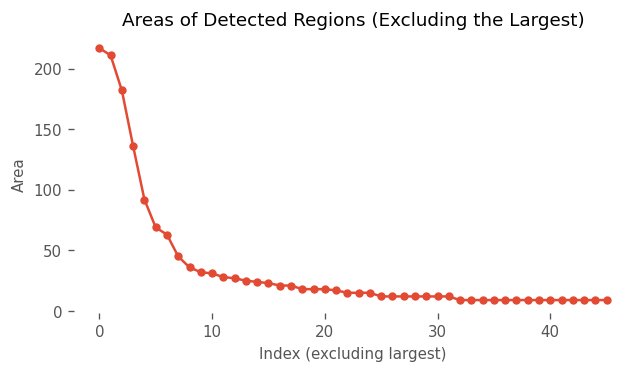

In [22]:
unique_labels = np.unique(mask_label)[1:]
filtered_props = [prop for prop in properties if prop.label in unique_labels]

# Create a DataFrame from the filtered properties
data = {
    'label': [prop.label for prop in filtered_props],
    'area': [prop.area for prop in filtered_props],
    'perimeter': [prop.perimeter for prop in filtered_props],
    'radius_mean': [np.mean(radii_from_centroid(prop)) for prop in filtered_props],
    'radius_std': [np.std(radii_from_centroid(prop)) for prop in filtered_props],
    'radius_min': [np.min(radii_from_centroid(prop)) for prop in filtered_props],
    'radius_max': [np.max(radii_from_centroid(prop)) for prop in filtered_props]
    # Add more features as needed
}

df = pd.DataFrame(data)

# Sort by area
df_sorted = df.sort_values(by='area', ascending=False)

# Plot excluding the largest
plt.figure(figsize=(6,3))
plt.plot(df_sorted['area'].iloc[1:].values, marker='o')  # Line plot with points
plt.xlabel('Index (excluding largest)')
plt.ylabel('Area')
plt.title('Areas of Detected Regions (Excluding the Largest)')
plt.show()

In [23]:
df_sorted[:10]

,label,area,perimeter,radius_mean,radius_std,radius_min,radius_max
0,419,496326.0,4749.422761,274.864682,105.393104,0.300297,488.487726
5,448,217.0,61.213203,5.730327,2.194133,0.433400,10.768995
41,842,211.0,70.041631,6.018395,2.594939,0.347914,12.110185
27,793,182.0,60.970563,5.825198,2.608024,0.083870,12.124193
7,459,136.0,60.627417,6.296327,3.125645,0.483396,13.245360
20,737,92.0,61.213203,5.600576,2.812181,0.864250,12.208656
37,833,69.0,35.899495,3.779884,1.742574,0.597552,7.157278
43,855,63.0,41.142136,4.639924,2.341999,0.311855,9.153130
36,832,45.0,26.242641,2.651259,1.037547,0.223331,4.387468
28,801,36.0,25.414214,3.034828,1.311042,0.590564,5.726536


Object number 793 is a piece of debris at the bottom left. The other pieces with area over 100 pixels are tissue. Since debris really is small bits of tissue, so the boundary between debris and tissue can be blurry. Here the two are distinguished by morphology on the H&E image and proximity to the main tissue.

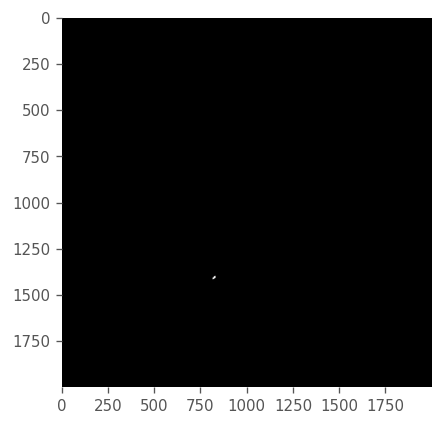

In [24]:
plt.figure(figsize=(4,4))
_ = plt.imshow(mask_label == 793, origin='upper', cmap = 'gray')

Here we remove the debris from the mask

In [25]:
mask_label[mask_label == 793] = 0

for unique_label in unique_labels:
    if int(df_sorted['area'][df_sorted['label'] == unique_label]) < 100:
        mask_label[mask_label == unique_label] = 0

Since most holes in the mask are faint regions of the tissue missed by thresholding, the holes will be filled

In [26]:
mask_label = binary_fill_holes(mask_label)

In [27]:
# Create outlines by subtracting eroded version from the mask
eroded = morphology.erosion(mask_label)
#!!! outlines = mask_label - eroded
outlines = np.logical_xor(mask_label, eroded)

# Create an RGBA image based on the grayscale image
rgba_img = color.gray2rgba(img2)

# Color map: Modify this part as per the number of labels and required colors
colors = {
    1: (1, 1, 0, 0.3),  # Yellow fill with 30% opacity
    2: (1, 0, 0, 1)     # Red for outlines with full opacity
}

# Apply colors: fill and outlines
for label, color_value in colors.items():
    if label == 1:
        mask = mask_label > 0
        rgba_img[mask] = rgba_img[mask] * (1 - color_value[3]) + np.array(color_value[:3] + (0,)) * color_value[3]
    elif label == 2:
        rgba_img[outlines > 0] = color_value


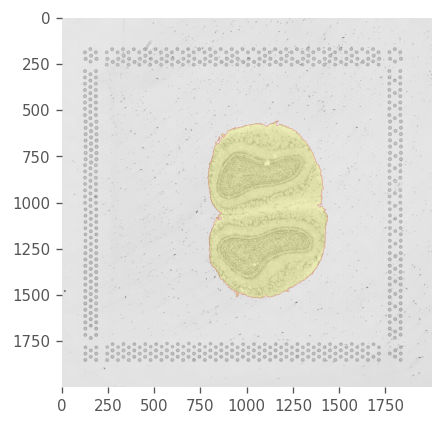

In [28]:
plt.figure(figsize=(4,4))
_ = plt.imshow(rgba_img, origin = 'upper')

This segmentation process took a lot of manual oversight, in choosing the threshold, choosing kernel size and shape in the opening and closing operations, deciding whether to fill the holes, and deciding what is debris and what is tissue.

# Convert tissue mask to polygon

In [29]:
mask_label_binary = mask_label
mask_label_binary[mask_label_binary != 0] = 255
mask_label_binary = mask_label_binary.astype(np.uint8)

In [30]:
np.unique(mask_label_binary)

array([0, 1], dtype=uint8)

In [31]:
adata.uns["spatial"]["geom"] = {}
adata.uns["spatial"]["geom"]["tissueBoundary_hires"] = vp.spatial.get_tissue_boundary(adata, size = adata_image_res)

The tissue boundary must be scaled between hires image and full image

In [32]:
with json_path.open() as file:
    data = json.load(file)
    lowres_boundary_scale_factor = data['tissue_lowres_scalef']
    hires_boundary_scale_factor = data['tissue_hires_scalef']
    spot_scale_factor = data['spot_diameter_fullres']

adata.uns["spatial"]["geom"]["tissueBoundary"] = scale(adata.uns["spatial"]["geom"]["tissueBoundary_hires"], xfact=1/hires_boundary_scale_factor, yfact = 1/hires_boundary_scale_factor, origin = (0,0))
adata.uns["spatial"]["geom"]["tissueBoundary_lowres"] = scale(adata.uns["spatial"]["geom"]["tissueBoundary"], xfact=lowres_boundary_scale_factor, yfact = lowres_boundary_scale_factor, origin = (0,0))
adata.uns["spatial"]["geom"]["tissueBoundary_hires_exterior"] = adata.uns["spatial"]["geom"]["tissueBoundary_hires"].exterior

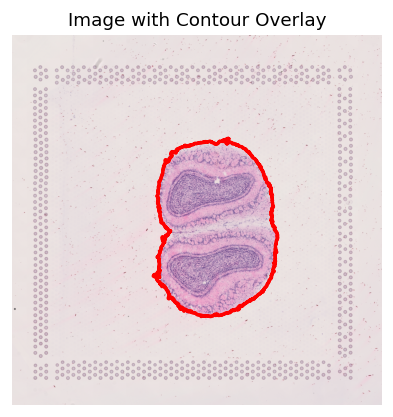

In [33]:
plt.figure(figsize=(4,4))
plt.imshow(im, origin = 'upper')  # Show the image
plt.title('Image with Contour Overlay')
plt.axis('off')  # Hide axes

x, y = adata.uns["spatial"]["geom"]["tissueBoundary_hires"].exterior.xy
plt.plot(x, y, color="red", linewidth=2)  # Plot the polygon with a specified color and line width

plt.show()

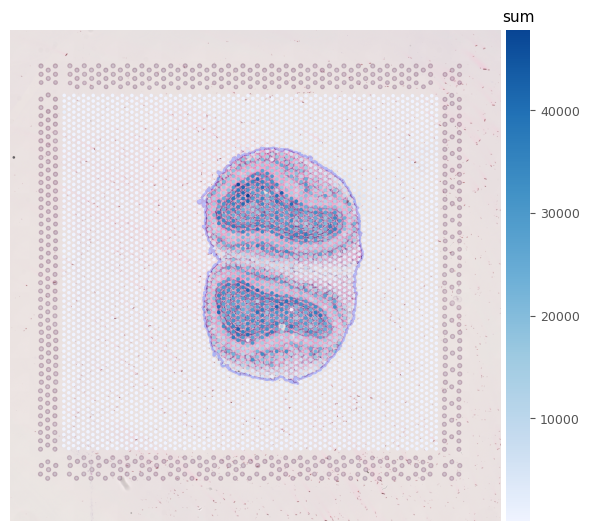

In [34]:
axs = vp.plt.plot_spatial_feature(
    adata,
    "sum",
    image_kwargs=dict(),
    annot_geom = 'tissueBoundary_hires_exterior',
    subplot_kwargs=dict(figsize=(6,6), dpi=100, layout='tight')
)

The mouse olfactory bulb is conventionally plotted horizontally. The image can be transposed in histologial space to make the olfactory bulb horizontal. The tissue boundaries are recomputed on the transposed image.

In [35]:
adata.uns["spatial"]["img"][adata_image_res] = np.swapaxes(adata.uns["spatial"]["img"][adata_image_res], 0, 1)
# vp.spatial.rotate_img90(adata, k = 2)

adata.uns["spatial"]["geom"]["tissueBoundary_hires"] = vp.spatial.get_tissue_boundary(adata, size = adata_image_res)
adata.uns["spatial"]["geom"]["tissueBoundary"] = scale(adata.uns["spatial"]["geom"]["tissueBoundary_hires"], xfact=1/hires_boundary_scale_factor, yfact = 1/hires_boundary_scale_factor, origin = (0,0))
adata.uns["spatial"]["geom"]["tissueBoundary_lowres"] = scale(adata.uns["spatial"]["geom"]["tissueBoundary"], xfact=lowres_boundary_scale_factor, yfact = lowres_boundary_scale_factor, origin = (0,0))
adata.uns["spatial"]["geom"]["tissueBoundary_hires_exterior"] = adata.uns["spatial"]["geom"]["tissueBoundary_hires"].exterior

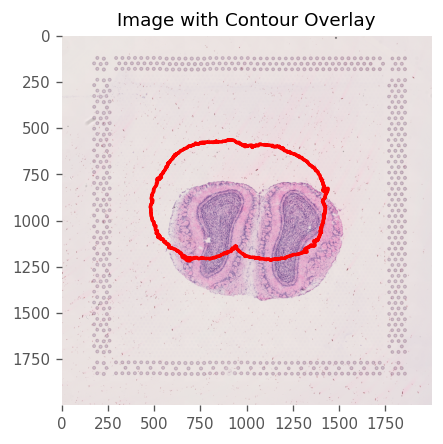

In [36]:
transposed_im = np.transpose(im, (1, 0, 2))
transposed_mask_label_binary = np.transpose(mask_label_binary)

plt.figure(figsize=(4,4))
plt.imshow(transposed_im, origin = 'upper')  # Show the image
plt.title('Image with Contour Overlay')
# plt.axis('off')  # Hide axes

x, y = adata.uns["spatial"]["geom"]["tissueBoundary_hires"].exterior.xy
plt.plot(x, y, color="red", linewidth=2)  # Plot the polygon with a specified color and line width

plt.show()

In [37]:
spatial_coords_df = adata.obs[['pxl_row_in_fullres', 'pxl_col_in_fullres']]
spatial_coords_df

,pxl_row_in_fullres,pxl_col_in_fullres
AAACAACGAATAGTTC-1,7762,1101
AAACAAGTATCTCCCA-1,2887,6022
AAACAATCTACTAGCA-1,6232,1395
AAACACCAATAACTGC-1,7586,6914
AAACAGAGCGACTCCT-1,3343,2476
...,...,...
TTGTTTCACATCCAGG-1,6283,6814
TTGTTTCATTAGTCTA-1,6963,7012
TTGTTTCCATACAACT-1,7134,5534
TTGTTTGTATTACACG-1,6338,8292


Then we can use geometric operations to find which spots intersect tissue (intersect with or covered by boundary), which spots are fully covered by tissue (without intersecting), and how much of each spot intersects tissue.

In [38]:
width_of_original_im = im.shape[0] / hires_boundary_scale_factor
height_of_original_im = im.shape[1] / hires_boundary_scale_factor

adata.obs['pxl_col_in_fullres_transposed'] = adata.obs.apply(
    lambda row: row['pxl_row_in_fullres'],
    axis=1
)
adata.obs['pxl_row_in_fullres_transposed'] = adata.obs.apply(
    lambda row: row['pxl_col_in_fullres'],
    axis=1
)

def check_intersection(row):
    # Create a circle at the given coordinates with the specified radius
    circle = Point(row['pxl_col_in_fullres_transposed'], row['pxl_row_in_fullres_transposed']).buffer(0.5*spot_scale_factor)

    # Check if the circle intersects any polygon
    found_intersection = circle.intersects(adata.uns["spatial"]["geom"]["tissueBoundary"])

    return found_intersection

def check_contain(row):
    # Create a circle at the given coordinates with the specified radius
    circle = Point(row['pxl_col_in_fullres_transposed'], row['pxl_row_in_fullres_transposed']).buffer(0.5*spot_scale_factor)

    # Check if the circle intersects any polygon
    found_contain = contains(adata.uns["spatial"]["geom"]["tissueBoundary"], circle)

    return found_contain

adata.obs['intersects_boundary'] = adata.obs.apply(check_intersection, axis=1)
adata.obs['contained_in_boundary'] = adata.obs.apply(check_contain, axis=1)

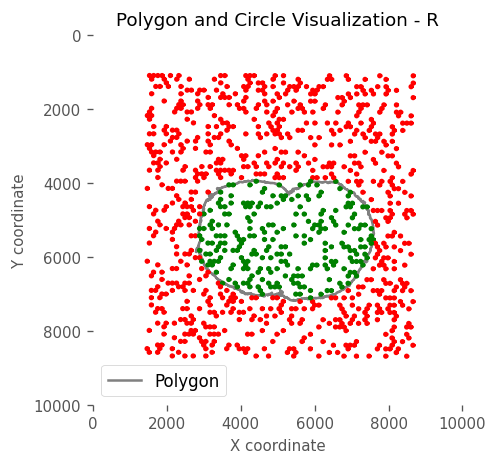

In [39]:
fig, ax = plt.subplots(figsize=(4, 4))

x, y = adata.uns["spatial"]["geom"]["tissueBoundary"].exterior.xy
ax.plot(x, y, color='gray', label='Polygon')


# Plot each point as a circle, color based on intersection result
for barcode in list(adata.obs.index[:1000]):
    matching_row = adata.obs[adata.obs.index == barcode]

    pxl_row_in_fullres_value_upright = matching_row['pxl_row_in_fullres'].iloc[0]
    pxl_col_in_fullres_value_upright = matching_row['pxl_col_in_fullres'].iloc[0]

    pxl_row_in_fullres_value_transposed = pxl_col_in_fullres_value_upright
    pxl_col_in_fullres_value_transposed = pxl_row_in_fullres_value_upright

    point = Point(pxl_col_in_fullres_value_transposed, pxl_row_in_fullres_value_transposed)
    circle = point.buffer(0.5 * spot_scale_factor)  # Create the circle with a radius of half the spot diameter
    circle_x, circle_y = circle.exterior.xy
    color = 'green' if matching_row['intersects_boundary'].iloc[0] else 'red'
    ax.plot(circle_x, circle_y, color=color)

# Set aspect of the plot to be equal and invert y-axis
ax.set_aspect('equal')
ax.invert_yaxis()

# Enhancements for better visualization
ax.legend()  # Add a legend to identify the polygon and circle
plt.title('Polygon and Circle Visualization - R')
plt.xlabel('X coordinate')
plt.ylabel('Y coordinate')
ax.set_xlim([0, 10000])
ax.set_ylim([10000, 0])

# Show the plot
plt.show()

In [40]:
adata.obs.rename(columns={
    'pxl_row_in_fullres': 'pxl_row_in_fullres_upright',
    'pxl_col_in_fullres': 'pxl_col_in_fullres_upright',
    'pxl_col_in_fullres_transposed': 'pxl_col_in_fullres',
    'pxl_row_in_fullres_transposed': 'pxl_row_in_fullres'
}, inplace=True)

visium_spots = vp.spatial.get_visium_spots(adata, with_radius=True)

_ = vp.spatial.set_geometry(adata, geom="spot_poly", values=visium_spots)

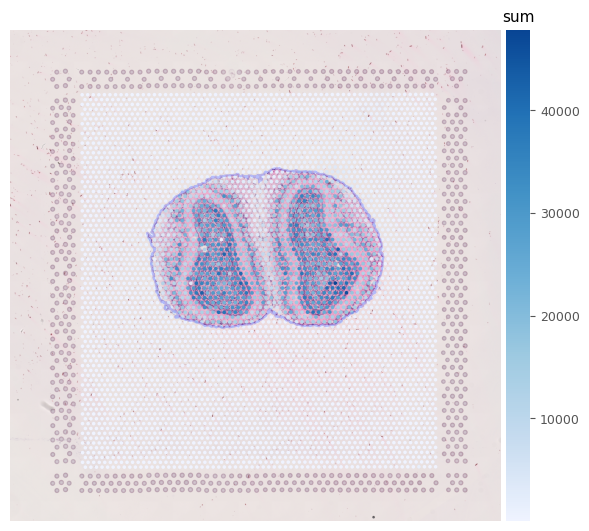

In [41]:
axs = vp.plt.plot_spatial_feature(
    adata,
    "sum",
    image_kwargs=dict(),
    annot_geom = 'tissueBoundary_hires_exterior',
    subplot_kwargs=dict(figsize=(6,6), dpi=100, layout='tight')
)

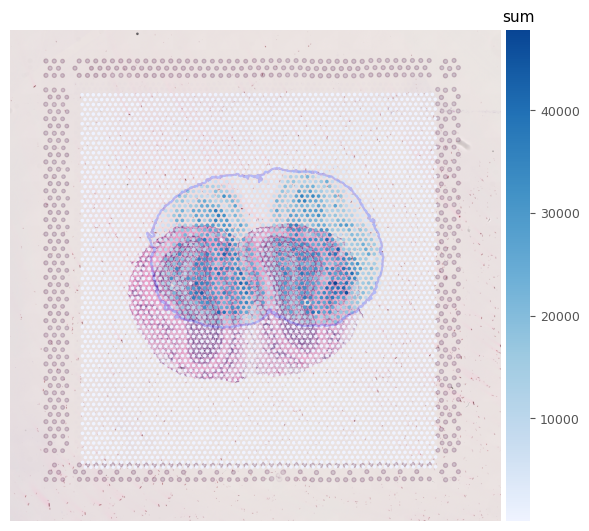

In [45]:
# vp.spatial.rotate_img90(adata, k = 2)

# axs = vp.plt.plot_spatial_feature(
#     adata,
#     "sum",
#     image_kwargs=dict(),
#     annot_geom = 'tissueBoundary_hires_exterior',
#     subplot_kwargs=dict(figsize=(6,6), dpi=100, layout='tight')
# )

Discrepancies between Space Ranger’s annotation and the annotation based on tissue segmentation here:

In [42]:
def evaluate_conditions(row):
    if bool(row['in_tissue']) and not bool(row['intersects_boundary']):
        return "Space Ranger"
    elif bool(row['intersects_boundary']) and not bool(row['in_tissue']):
        return "Segmentation"
    else:
        return "Same"
    
adata.obs['diff_sr'] = adata.obs.apply(evaluate_conditions, axis=1)

adata.obs['diff_sr'] = adata.obs['diff_sr'].astype('category')

In [43]:
colors_dict = {'Space Ranger': 'orange', 'Segmentation': 'purple', 'Same': 'gray'}
sorted_color_dict = {key: colors_dict[key] for key in sorted(colors_dict.keys())}
colors_list = list(sorted_color_dict.values())
my_cat_cmap = ListedColormap(colors_list)

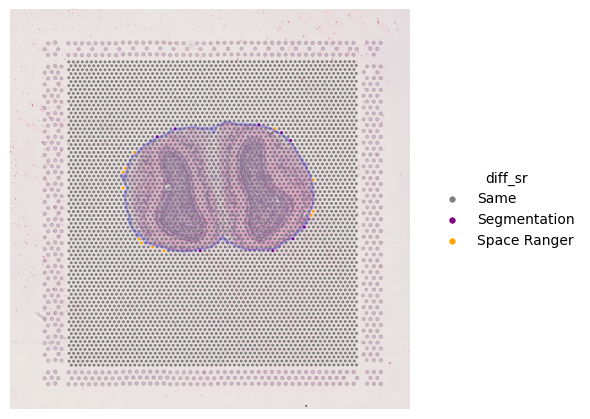

In [44]:
axs = vp.plt.plot_spatial_feature(
    adata,
    "diff_sr",
    annot_geom = 'tissueBoundary_hires_exterior',
    image_kwargs=dict(),
    cat_cmap=my_cat_cmap,
    subplot_kwargs=dict(figsize=(6,6), dpi=100, layout='tight')
)

Spots at the margin can intersect the tissue without being covered by it.

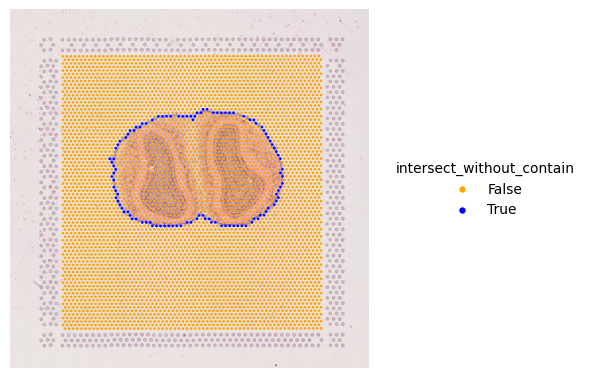

In [45]:
def intersect_without_contain(row):
    if bool(row['intersects_boundary']) and not bool(row['contained_in_boundary']):
        return True
    else:
        return False
    
adata.obs['intersect_without_contain'] = adata.obs.apply(intersect_without_contain, axis=1)

adata.obs['intersect_without_contain'] = adata.obs['intersect_without_contain'].astype('category')

colors_dict = {'True': 'blue', 'False': 'orange'}
sorted_color_dict = {key: colors_dict[key] for key in sorted(colors_dict.keys())}
colors_list = list(sorted_color_dict.values())
my_cat_cmap = ListedColormap(colors_list)

axs = vp.plt.plot_spatial_feature(
    adata,
    "intersect_without_contain",
    annot_geom = 'tissueBoundary_hires_exterior',
    image_kwargs=dict(),
    cat_cmap=my_cat_cmap,
    subplot_kwargs=dict(figsize=(6,6), dpi=100, layout='tight')
)

We can also get the geometries of the intersections between the tissue and the Visium spots, and then calculate what percentage of each spot is in tissue. However, this percentage may not be very useful if the tissue segmentation is subject to error. This percentage may be more useful for pathologist annotated histological regions or objects such as nuclei and myofibers.

In [46]:
def check_fraction_visium_spot_in_tissue(row):
    # Create a circle at the given coordinates with the specified radius
    circle = Point(row['pxl_col_in_fullres'], row['pxl_row_in_fullres']).buffer(0.5*spot_scale_factor)

    # Check if the circle intersects any polygon
    intersection = circle.intersection(adata.uns["spatial"]["geom"]["tissueBoundary"])

    fraction_in_tissue = intersection.area / circle.area

    return fraction_in_tissue

adata.obs['fraction_in_tissue'] = adata.obs.apply(check_fraction_visium_spot_in_tissue, axis=1)

For spots that intersect tissue, does total counts relate to percentage of the spot in tissue?

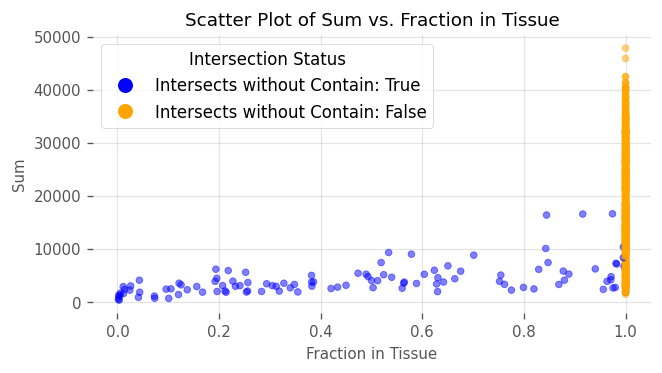

In [47]:
# Create the scatter plot
adata_list = adata.obs[adata.obs['fraction_in_tissue'] > 0]
color_values = adata_list['intersect_without_contain'].astype(str).map({'True': 'blue', 'False': 'orange'})

plt.figure(figsize=(6,3))
plt.scatter(adata_list['fraction_in_tissue'], adata_list['sum'], c=color_values, alpha=0.5)  # alpha for transparency

# Adding labels and title
plt.xlabel('Fraction in Tissue')
plt.ylabel('Sum')
plt.title('Scatter Plot of Sum vs. Fraction in Tissue')

# Show grid
plt.grid(True)


legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='Intersects without Contain: True'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='Intersects without Contain: False')
]
plt.legend(handles=legend_elements, title="Intersection Status")

# Display the plot
plt.show()

Spots that are not fully covered by tissue have lower total UMI counts, which can be due to both that they are not fully in tissue and the cell types with lower total counts in the histological region near the edge, as some spots fully covered by tissue also have low UMI counts.

# Spatial autocorrelation of QC metrics

In [48]:
adata_raw = adata.copy()

In [49]:
mask = adata.obs['fraction_in_tissue'] > 0

# Subset the AnnData object using the mask
adata = adata[mask].copy()

In [50]:
nn_graph = 'visium_graph'
nn_graph_object = vp.spatial.find_visium_graph(
    adata,
    subset=None,
    geom=None,
    graph_key=None,
    inplace=False,  # This is important as we don't want to modify the original graph
)

sparse_matrix = nx.to_scipy_sparse_array(nn_graph_object, nodelist=sorted(nn_graph_object.nodes()))

adata.obsp[nn_graph] = sparse_matrix

AnnData object with n_obs × n_vars = 1182 × 32285
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres_upright', 'pxl_col_in_fullres_upright', 'sum', 'detected', 'subsets_mito_sum', 'subsets_mito_detected', 'subsets_mito_percent', 'pxl_col_in_fullres', 'pxl_row_in_fullres', 'intersects_boundary', 'contained_in_boundary', 'diff_sr', 'intersect_without_contain', 'fraction_in_tissue'
    var: 'symbol', 'feature_types'
    uns: 'config', 'spatial', 'metadata'
    obsm: 'geometry'
    obsp: 'visium_graph'

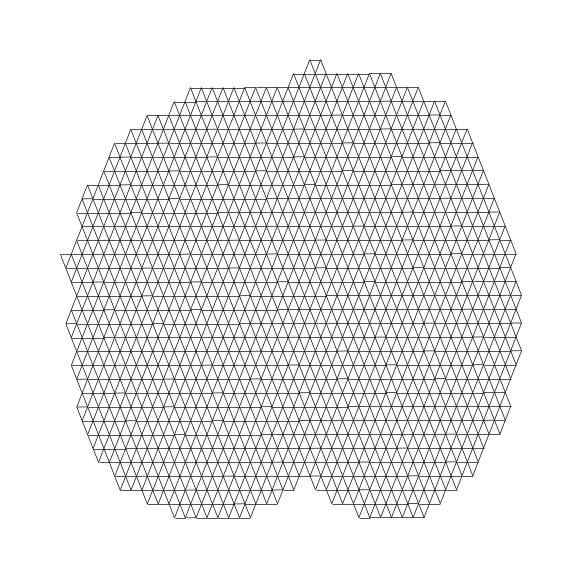

In [51]:
visium_graph = vp.plotting.draw_graph(adata, nn_graph)
vp.spatial.set_default_graph(adata, nn_graph)
vp.spatial.to_spatial_weights(adata, graph_name=nn_graph)

In [52]:
vp.spatial.moran(adata, feature = qc_features, graph_name = nn_graph, permutations = 200)
adata.uns['spatial']['moran'][nn_graph].loc[qc_features, ["I"]]

,I
detected,0.736931
subsets_mito_percent,0.640181
sum,0.728619


In [53]:
adata.uns['spatial']['moran'][nn_graph]
# adata.uns['spatial']['moran_mc'][nn_graph]['sum']

,I,EI
detected,0.736931,-0.000847
subsets_mito_percent,0.640181,-0.000847
sum,0.728619,-0.000847


In [54]:
adata.uns['spatial']['moran_mc'][nn_graph]

{'detected':           sim     p_sim
 0   -0.001201  0.004975
 1   -0.018487  0.004975
 2    0.013683  0.004975
 3    0.034303  0.004975
 4   -0.013720  0.004975
 ..        ...       ...
 195  0.004058  0.004975
 196  0.008976  0.004975
 197  0.016665  0.004975
 198  0.014643  0.004975
 199  0.005548  0.004975
 
 [200 rows x 2 columns],
 'subsets_mito_percent':           sim     p_sim
 0   -0.004560  0.004975
 1    0.009927  0.004975
 2   -0.022589  0.004975
 3   -0.014203  0.004975
 4   -0.010561  0.004975
 ..        ...       ...
 195  0.016720  0.004975
 196  0.015249  0.004975
 197 -0.003085  0.004975
 198 -0.016216  0.004975
 199 -0.023304  0.004975
 
 [200 rows x 2 columns],
 'sum':           sim     p_sim
 0    0.014028  0.004975
 1   -0.033805  0.004975
 2   -0.002187  0.004975
 3   -0.027740  0.004975
 4    0.005449  0.004975
 ..        ...       ...
 195  0.020700  0.004975
 196  0.009678  0.004975
 197  0.027475  0.004975
 198 -0.000519  0.004975
 199 -0.030932  0.004975
 
 

In [55]:
qc_features

['detected', 'subsets_mito_percent', 'sum']

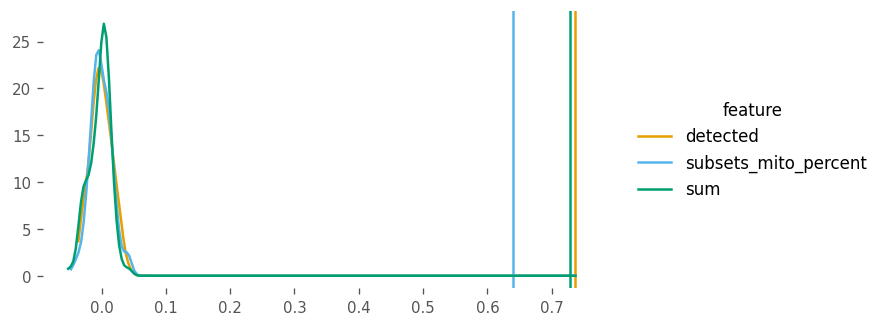

In [56]:
_ = vp.plotting.plot_moran_mc(adata, qc_features, nn_graph, figsize=(6,3))

In [57]:
vp.spatial.compute_higher_order_neighbors(adata, order=8)
vp.spatial.compute_correlogram(adata, qc_features, order=8)

,1,2,3,4,5,6,7,8
detected,0.729113,0.585958,0.481086,0.386634,0.296868,0.211707,0.137898,0.0757
subsets_mito_percent,0.641761,0.418675,0.274361,0.155674,0.070412,0.011243,-0.012856,-0.026703
sum,0.723744,0.579358,0.475261,0.378051,0.282435,0.196302,0.118677,0.059765


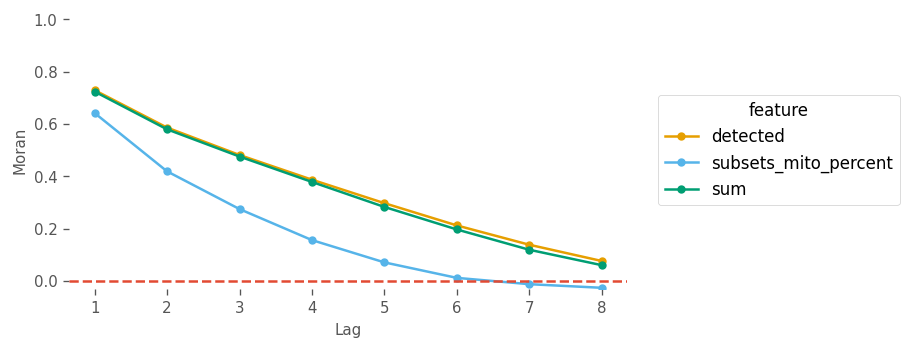

In [58]:
fig, ax = plt.subplots(figsize=(6,3))
_ = vp.plt.plot_correlogram(adata, graph_name = 'visium_graph', features=qc_features, show_symbol=False, ax=ax)

In [59]:
_ = vp.spatial.local_moran(adata, feature = qc_features)

In [60]:
# _ = vp.plt.plot_spatial_feature(
#     adata,
#     features = qc_features,
#     obsm='local_moran',
#     divergent=True
# )

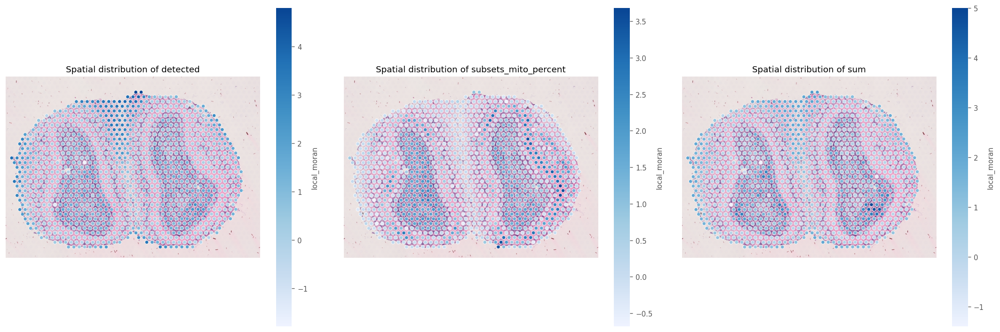

In [61]:
visium_coords = vp.spatial.to_points(
    x="pxl_col_in_fullres",
    y="pxl_row_in_fullres",
    data=adata.obs,
    scale=hires_boundary_scale_factor,
    radius=None
)

x_coords = visium_coords.geometry.x
y_coords = visium_coords.geometry.y
radius = hires_boundary_scale_factor * spot_scale_factor / 2

# def plot_local_spatial_feature(adata, spatial_feature, metric):
def plot_local_spatial_feature(adata, spatial_feature, metric, ax, crop_image = True):
    image = adata.uns['spatial']['img']['hires']
    geometries = adata.obsm['geometry']  # Polygon data for each spot
    values = adata.obsm[spatial_feature][metric]

    # Normalize values
    norm_values = (values - values.min()) / (values.max() - values.min())

    # Optional: Define a colormap
    cmap = plt.get_cmap('Blues7')

    if crop_image:
        xmin, ymin, xmax, ymax = adata.uns["spatial"]["geom"]["tissueBoundary_hires"].bounds
        xmin = int(0.95*xmin)
        ymin = int(0.95*ymin)
        xmax = int(1.05*xmax)
        ymax = int(1.05*ymax)
    else:
        xmin, ymin = (0,0)

    image = image[ymin:ymax, xmin:xmax]

    ax.imshow(image, aspect='equal')

    # Create a color map
    color_map = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=values.min(), vmax=values.max()))

    # Iterate through the geometries and plot them
    for index, value in zip(geometries['spot_poly'].index, norm_values):
        circle = patches.Circle((x_coords[index]-xmin, y_coords[index]-ymin), radius, color=cmap(value), ec='white', linewidth=0.5)
        ax.add_patch(circle)

    # Add color bar
    cbar = fig.colorbar(color_map, ax=ax, orientation='vertical', label=spatial_feature)

    ax.axis('off')
    ax.set_title(f'Spatial distribution of {metric}')


# Plot each metric in its subplot
num_metrics = len(qc_features)
cols = 3
rows = (num_metrics + cols - 1) // cols  # Calculate needed rows

fig, axes = plt.subplots(rows, cols, figsize=(18, 6 * rows))  # Adjust overall figure size
axes = axes.flatten()

for i, metric in enumerate(qc_features):
    plot_local_spatial_feature(adata, 'local_moran', metric, axes[i])

plt.tight_layout()
plt.show()

In [62]:
_ = vp.spatial.losh(adata, feature = qc_features)

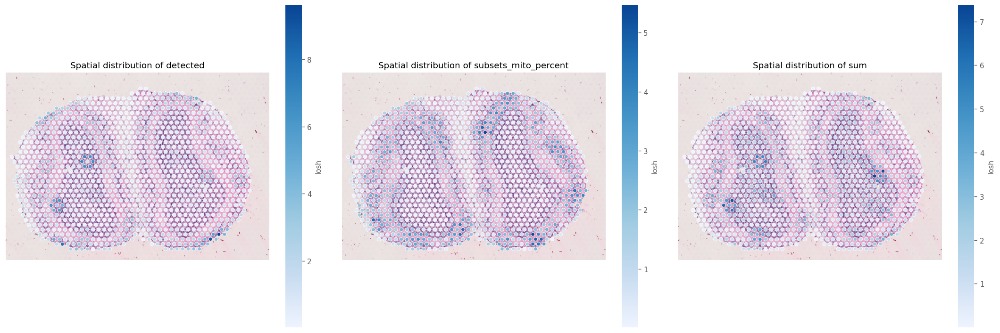

In [63]:
# Plot each metric in its subplot
num_metrics = len(qc_features)
cols = 3
rows = (num_metrics + cols - 1) // cols  # Calculate needed rows

fig, axes = plt.subplots(rows, cols, figsize=(18, 6 * rows))  # Adjust overall figure size
axes = axes.flatten()

for i, metric in enumerate(qc_features):
    plot_local_spatial_feature(adata, 'losh', metric, axes[i])

plt.tight_layout()
plt.show()

array([[<AxesSubplot: xlabel='subsets_mito_percent', ylabel='Spatially lagged subsets_mito_percent'>]],
      dtype=object)

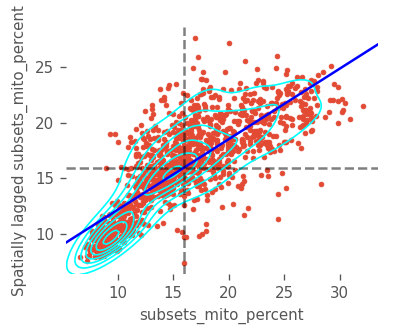

In [64]:
vp.plotting.moran_plot(adata, feature = 'subsets_mito_percent', graph_name = 'visium_graph', figsize=(3,3))

# Spatial autocorrelation of gene expression
Normalize data and find highly variable genes

In [65]:
adata.layers['logcounts'] = vp.utils.log_norm_counts(adata, inplace=False, zero_to_zero = False)

# vp.utils.log_norm_counts(adata, inplace=True, zero_to_zero = False)
# adata.layers['logcounts'] = adata.X.copy()

In [66]:
gene_var = vp.utils.model_gene_var(adata.layers['logcounts'], gene_names=adata.var_names)
hvgs = vp.utils.get_top_hvgs(gene_var)
adata.var['highly_variable'] = False
adata.var.loc[hvgs, 'highly_variable'] = True

Find Moran’s I for all highly variable genes:

In [67]:
vp.spatial.moran(adata, feature=hvgs, dim='var', graph_name=nn_graph)
hvgs_moransI = adata.uns['spatial']['moran'][nn_graph].loc[hvgs, 'I']
adata.var.loc[hvgs, "moran"] = hvgs_moransI

In [68]:
adata.var.loc[hvgs, ["symbol", "moran"]].sort_values(by='moran')

,symbol,moran
ENSMUSG00000015839,Nfe2l2,-0.024934
ENSMUSG00000038393,Txnip,-0.022214
ENSMUSG00000042286,Stab1,-0.020917
ENSMUSG00000027111,Itga6,-0.020555
ENSMUSG00000020100,Slc29a3,-0.017155
...,...,...
ENSMUSG00000021303,Gng4,0.766116
ENSMUSG00000009013,Dynll1,0.773535
ENSMUSG00000028833,Ncdn,0.778418
ENSMUSG00000053310,Nrgn,0.788144


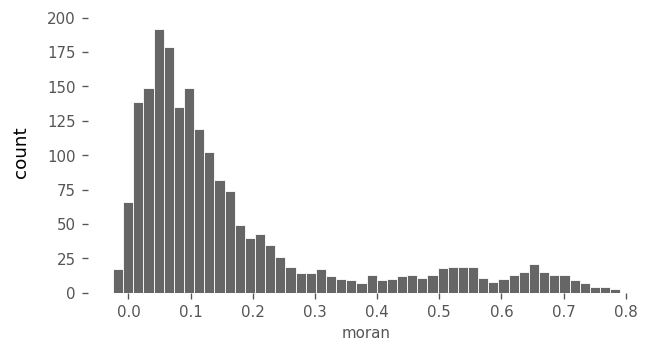

In [69]:
_ = vp.plt.plot_features_histogram(
    adata,
    "moran",
    bins=50,
    log=False,
    histtype="bar" ,
    show_symbol=True,
    figsize = (6,3)
)

The vast majority of genes have positive Moran’s I. Here we’ll find the genes with the highest Moran’s I:

In [70]:
top_moran = adata.var[adata.var['highly_variable']]['moran'] \
                    .dropna() \
                    .sort_values(ascending=False) \
                    .head(9) \
                    .index.tolist()

We can use the gget info module from the gget package to get additional information on these genes, such as their descriptions, synonyms, transcripts and more from a collection of reference databases including Ensembl, UniProt and NCBI Here, we are showing their gene descriptions from NCBI:

In [71]:
top_moran
# for ensembl_id in top_moran:
#     gget.info(ensembl_id)['primary_gene_name'].iloc[0]

['ENSMUSG00000090223',
 'ENSMUSG00000053310',
 'ENSMUSG00000028833',
 'ENSMUSG00000009013',
 'ENSMUSG00000021303',
 'ENSMUSG00000036438',
 'ENSMUSG00000046447',
 'ENSMUSG00000048644',
 'ENSMUSG00000072235']

Plot the genes with the highest Moran’s I:

In [72]:
# ax = vp.plt.plot_spatial_feature(
#     adata,
#     top_moran,
#     layer='logcounts',
#     aspect='equal',
# )

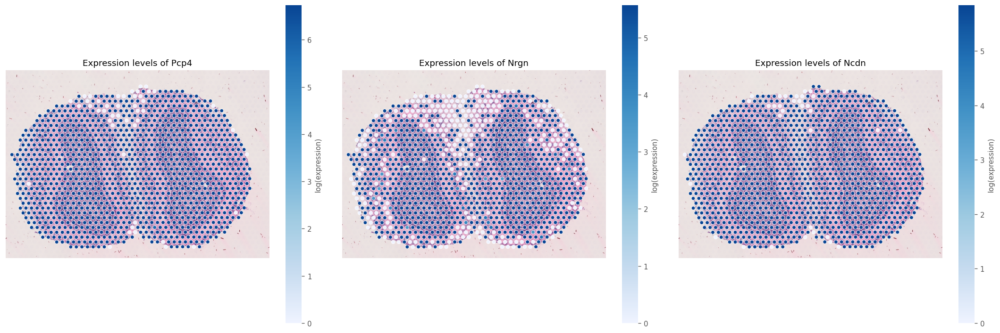

In [73]:
def plot_gene_expression(adata, gene, ax, crop_image = True):
    image = adata.uns['spatial']['img']['hires']
    geometries = adata.obsm['geometry']  # Polygon data for each spot
    gene_index = adata.var.index.get_loc(gene)
    values = adata.layers['logcounts'][:, gene_index]

    # Optional: Define a colormap
    cmap = plt.get_cmap('Blues7')

    if crop_image:
        xmin, ymin, xmax, ymax = adata.uns["spatial"]["geom"]["tissueBoundary_hires"].bounds
        xmin = int(0.95*xmin)
        ymin = int(0.95*ymin)
        xmax = int(1.05*xmax)
        ymax = int(1.05*ymax)
    else:
        xmin, ymin = (0,0)

    image = image[ymin:ymax, xmin:xmax]

    ax.imshow(image, aspect='equal')

    # Create a color map
    color_map = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=values.min(), vmax=values.max()))

    # Iterate through the geometries and plot them
    for index, value in zip(geometries['spot_poly'].index, values):
        circle = patches.Circle((x_coords[index]-xmin, y_coords[index]-ymin), radius, color=cmap(value[0,0]), ec='white', linewidth=0.5)
        ax.add_patch(circle)

    # Add color bar
    cbar = fig.colorbar(color_map, ax=ax, orientation='vertical', label='log(expression)')

    ax.axis('off')
    ax.set_title(f'Expression levels of {gget.info(gene)["primary_gene_name"].iloc[0]}')

genes_to_plot = top_moran[:3]

num_metrics = len(genes_to_plot)
cols = 3
rows = (num_metrics + cols - 1) // cols  # Calculate needed rows

fig, axes = plt.subplots(rows, cols, figsize=(18, 6 * rows))  # Adjust overall figure size
axes = axes.flatten()

for i, gene in enumerate(genes_to_plot):
    plot_gene_expression(adata, gene, axes[i])
    
plt.tight_layout()
plt.show()

Here global Moran’s I seems to be more about tissue structure.

Some genes have negative Moran’s I that might not be statistically significant:

In [74]:
neg_moran = adata.var[adata.var['highly_variable']]['moran'] \
                    .dropna() \
                    .sort_values(ascending=True) \
                    .head(9) \
                    .index.tolist()

neg_moran
# for ensembl_id in neg_moran:
#     gget.info(ensembl_id)['primary_gene_name'].iloc[0]

['ENSMUSG00000015839',
 'ENSMUSG00000038393',
 'ENSMUSG00000042286',
 'ENSMUSG00000027111',
 'ENSMUSG00000020100',
 'ENSMUSG00000044328',
 'ENSMUSG00000022969',
 'ENSMUSG00000038387',
 'ENSMUSG00000034320']

In [75]:
adata

AnnData object with n_obs × n_vars = 1182 × 32285
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres_upright', 'pxl_col_in_fullres_upright', 'sum', 'detected', 'subsets_mito_sum', 'subsets_mito_detected', 'subsets_mito_percent', 'pxl_col_in_fullres', 'pxl_row_in_fullres', 'intersects_boundary', 'contained_in_boundary', 'diff_sr', 'intersect_without_contain', 'fraction_in_tissue'
    var: 'symbol', 'feature_types', 'highly_variable', 'moran'
    uns: 'config', 'spatial', 'metadata'
    obsm: 'geometry', 'local_moran', 'losh'
    layers: 'logcounts'
    obsp: 'visium_graph'

Mon Apr 29 12:08:20 2024 WARNING No reviewed UniProt results were found for ID ENSMUSG00000042286. Returning all unreviewed results.


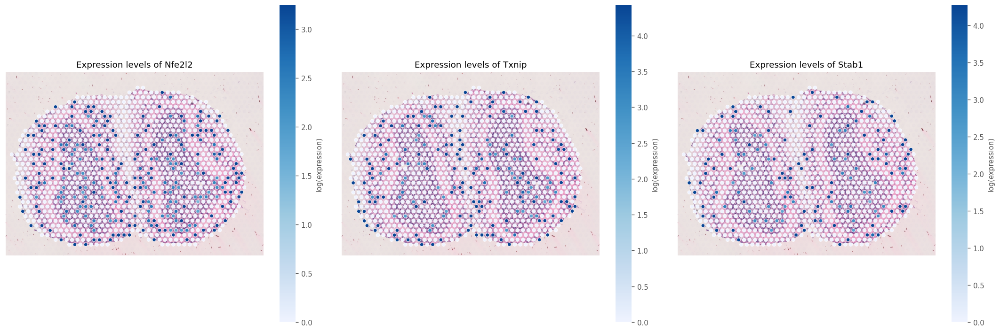

In [76]:
genes_to_plot = neg_moran[:3]

num_metrics = len(genes_to_plot)
cols = 3
rows = (num_metrics + cols - 1) // cols  # Calculate needed rows

fig, axes = plt.subplots(rows, cols, figsize=(18, 6 * rows))  # Adjust overall figure size
axes = axes.flatten()

for i, gene in enumerate(genes_to_plot):
    plot_gene_expression(adata, gene, axes[i])
    
plt.tight_layout()
plt.show()

In [77]:
vp.spatial.moran(adata, feature = neg_moran, graph_name = nn_graph, dim = 'var', permutations = 200)

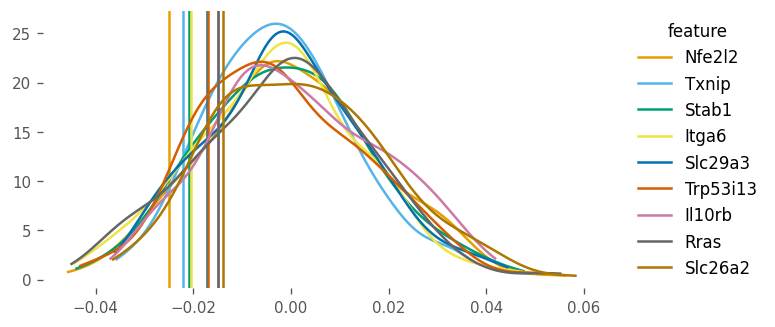

In [78]:
_ = vp.plotting.plot_moran_mc(adata, neg_moran, nn_graph, figsize=(6,3))

In [79]:
for gene in neg_moran:
    true_moran = adata.uns['spatial']['moran']['visium_graph'].loc[gene, "I"]
    simulated_moran = adata.uns['spatial']['moran_mc']['visium_graph'][gene].iloc[0]['p_sim']
    print(f"{gene} True Moran I: {true_moran}; Simulated Moran I: {simulated_moran}")

ENSMUSG00000015839 True Moran I: -0.024934212729553082; Simulated Moran I: 0.07462686567164178
ENSMUSG00000038393 True Moran I: -0.022213796979070846; Simulated Moran I: 0.08955223880597014
ENSMUSG00000042286 True Moran I: -0.020917086645378787; Simulated Moran I: 0.11940298507462686
ENSMUSG00000027111 True Moran I: -0.02055543185933288; Simulated Moran I: 0.15920398009950248
ENSMUSG00000020100 True Moran I: -0.017155373982976684; Simulated Moran I: 0.1691542288557214
ENSMUSG00000044328 True Moran I: -0.016952007372087238; Simulated Moran I: 0.21890547263681592
ENSMUSG00000022969 True Moran I: -0.01496868410159271; Simulated Moran I: 0.15920398009950248
ENSMUSG00000038387 True Moran I: -0.014889063282407553; Simulated Moran I: 0.23383084577114427
ENSMUSG00000034320 True Moran I: -0.013928622720204918; Simulated Moran I: 0.208955223880597


As there are 2000 highly variable genes and 2000 tests, these would no longer be significant after correcting for multiple testing.

Does global Moran’s I relate to gene expression level?

In [80]:
logcounts = adata.X # adata.layers['logcounts']

if issparse(logcounts):
    # For sparse matrices, compute the mean across the rows (genes)
    mean_expression_across_spots = np.array(logcounts.mean(axis=0)).flatten()  # mean along columns
else:
    # For dense matrices, you can directly use numpy's mean function
    mean_expression_across_spots = np.mean(logcounts, axis=0)  # mean along columns

adata.var['mean_expression_across_spots'] = mean_expression_across_spots

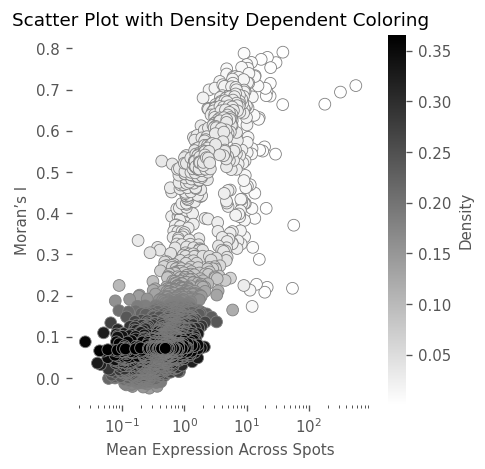

In [81]:
x=adata.var.loc[adata.var['highly_variable'], 'mean_expression_across_spots']
y=adata.var['moran']

plot_data = pd.DataFrame({
    'mean_expression_across_spots': x,
    'moran': y
}).dropna()

xy = np.vstack([plot_data.mean_expression_across_spots, plot_data.moran])
z = gaussian_kde(xy)(xy)

# Sort the points by density, so the densest points are plotted last
plot_data['density'] = z
plot_data = plot_data.sort_values(by='density')

plt.figure(figsize=(4,4))
scatterplot = plt.scatter('mean_expression_across_spots', 'moran', data=plot_data, c=plot_data['density'], cmap='gray_r', edgecolor='gray', s=50)
plt.colorbar(scatterplot, label='Density')
plt.xlabel('Mean Expression Across Spots')
plt.xscale('log')
plt.ylabel('Moran’s I')
plt.title('Scatter Plot with Density Dependent Coloring')

plt.show()


Genes that are more highly expressed overall tend to have higher Moran’s I.

# Apply spatial analysis methods to gene expression space

Spatial statistics that require a spatial neighborhood graph can also be applied to the k nearest neighbor graph not in histological space but in gene expression space. This is done in more depth in [this vignette](https://pmelsted.github.io/voyagerpy/examples/nonspatial.html).

In [82]:
vp.utils.log_norm_counts(adata, inplace=True)
adata.X = vp.utils.scale(adata.X, center=True)

sc.tl.pca(adata, use_highly_variable=True, n_comps=30, random_state=1337)
adata.X = adata.layers['logcounts'].copy()

In [83]:
sc.pp.neighbors(
    adata,
    n_pcs=10,
    use_rep='X_pca',
    knn=True,
    n_neighbors=10,
    key_added='knn'
)

In [84]:
dist = adata.obsp['knn_distances'].copy()
dist.data = 1 / dist.data

# row normalize the matrix, this makes the matrix dense.
dist /= dist.sum(axis=1)

# convert dist back to sparse matrix
adata.obsp["knn_weights"] = csr_matrix(dist)

del dist

knn_graph = "knn_weights"

# adata.obsp["knn_connectivities"] represent the edges, while adata.opsp["knn_weights"] represent the weights
adata.obsp["knn_connectivities"] = (adata.obsp[knn_graph] > 0).astype(int)
vp.spatial.set_default_graph(adata, knn_graph)
vp.spatial.to_spatial_weights(adata, graph_name=knn_graph)

AnnData object with n_obs × n_vars = 1182 × 32285
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres_upright', 'pxl_col_in_fullres_upright', 'sum', 'detected', 'subsets_mito_sum', 'subsets_mito_detected', 'subsets_mito_percent', 'pxl_col_in_fullres', 'pxl_row_in_fullres', 'intersects_boundary', 'contained_in_boundary', 'diff_sr', 'intersect_without_contain', 'fraction_in_tissue'
    var: 'symbol', 'feature_types', 'highly_variable', 'moran', 'mean_expression_across_spots'
    uns: 'config', 'spatial', 'metadata', 'pca', 'knn'
    obsm: 'geometry', 'local_moran', 'losh', 'X_pca'
    varm: 'PCs'
    layers: 'logcounts'
    obsp: 'visium_graph', 'knn_distances', 'knn_connectivities', 'knn_weights'

In [85]:
morans = vp.spatial.moran(adata, hvgs, dim = 'var', graph_name=knn_graph)

These are the genes that tend to be more similar to their neighbors in the 10 nearest neighbor graph in PCA space for gene expression rather than in histological space:

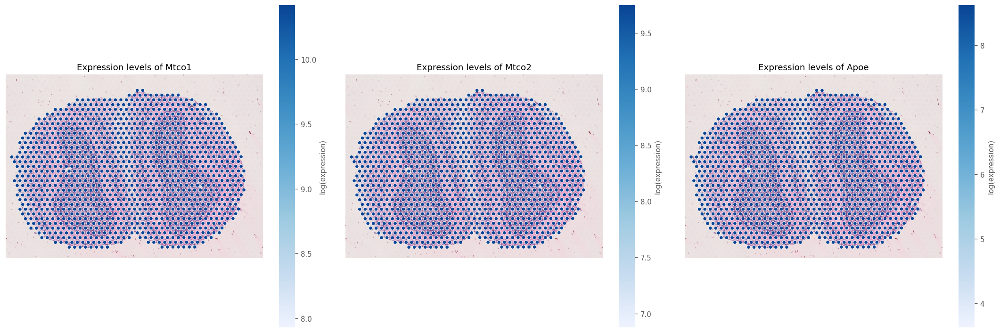

In [129]:
knn_moran_df = pd.DataFrame(adata.uns['spatial']['moran'][knn_graph])
adata.var['moran_knn'] = adata.var.index.map(knn_moran_df['I'])

top_moran2 = adata.var[adata.var['highly_variable']]['moran_knn'] \
                    .dropna() \
                    .sort_values(ascending=False) \
                    .head(9) \
                    .index.tolist()

genes_to_plot = top_moran2[:3]

num_metrics = len(genes_to_plot)
cols = 3
rows = (num_metrics + cols - 1) // cols  # Calculate needed rows

fig, axes = plt.subplots(rows, cols, figsize=(18, 6 * rows))  # Adjust overall figure size
axes = axes.flatten()

for i, gene in enumerate(genes_to_plot):
    plot_gene_expression(adata, gene, axes[i])
    
plt.tight_layout()
plt.show()

Although this Moran’s I was not computed in histological space, these genes with the highest Moran’s I in PCA space also show spatial structure, as different cell types reside in different spatial regions.

# Session info

In [87]:
%load_ext watermark
%watermark -v -m --iversions
# %watermark -v -m --iversions -p package1,package2,etc

Python implementation: CPython
Python version       : 3.9.18
IPython version      : 8.12.0

Compiler    : Clang 14.0.6 
OS          : Darwin
Release     : 22.6.0
Machine     : arm64
Processor   : arm
CPU cores   : 8
Architecture: 64bit

requests  : 2.31.0
matplotlib: 3.6.3
voyagerpy : 0.1.1
scanpy    : 1.9.6
json      : 2.0.9
skimage   : 0.22.0
numpy     : 1.23.5
pandas    : 1.5.3
gget      : 0.28.2
networkx  : 3.2.1

